<img style="padding-right: 25px;" src= "https://raw.githubusercontent.com/e-sensing/sits/master/inst/extdata/sticker/sits_sticker.png" align="left" width="64"/>
<img src="https://raw.githubusercontent.com/brazil-data-cube/code-gallery/master/img/logo-bdc.png" align="right" width="64" />

# <span style="color:#336699">Raster classification with the SITS R package</span>
<hr style="border:2px solid #0077b9;">

<div style="text-align: left;">
    <a href="https://nbviewer.jupyter.org/github/brazil-data-cube/code-gallery/blob/master/jupyter/R/sits/sits-timeseries-classification.ipynb"><img src="https://raw.githubusercontent.com/jupyter/design/master/logos/Badges/nbviewer_badge.svg" align="center"/></a>
</div>

<br/>

<div style="text-align: center;font-size: 90%;">
    Rolf Simoes<sup><a href="https://orcid.org/0000-0003-0953-4132"><i class="fab fa-lg fa-orcid" style="color: #a6ce39"></i></a></sup>, Felipe Souza<sup><a href="https://orcid.org/0000-0001-7534-0219"><i class="fab fa-lg fa-orcid" style="color: #a6ce39"></i></a></sup>, Felipe Menino<sup><a href="https://orcid.org/0000-0001-7534-0219"><i class="fab fa-lg fa-orcid" style="color: #a6ce39"></i></a></sup>, Gilberto Camara<sup><a href="https://orcid.org/0000-0001-7534-0219"><i class="fab fa-lg fa-orcid" style="color: #a6ce39"></i></a></sup>
    <br/><br/>
    Earth Observation and Geoinformatics Division, National Institute for Space Research (INPE)
    <br/>
    Avenida dos Astronautas, 1758, Jardim da Granja, São José dos Campos, SP 12227-010, Brazil
    <br/><br/>
        Contact: <a href="mailto:rolfsimoes@gmail.com">rolfsimoes@gmail.com</a>,  <a href="mailto:lipecaso@gmail.com">lipecaso@gmail.com</a>, <a href="mailto:efelipecarlos@gmail.com">efelipecarlos@gmail.com</a>, <a href="mailto:gilberto.camara.inpe@gmail.com">gilberto.camara.inpe@gmail.com</a>
    <br/><br/>
    Last Update: July 19, 2022
</div>
<br/>

<div style="text-align: justify;  margin-left: 15%; margin-right: 15%;">
<b>Abstract.</b> This Jupyter Notebook describes how to work with sits R package. It shows how to perform satellite time series classification using machine learning algorithms. It starts by accessing time series in a local data cube. After the local cube is created. Time series are extracted from the data cube using a predefined sample set. Next, a machine learning model is trained on the time series. This demonstrates the generation of a thematic map from the trained model. Finally, post-processing and evaluation of the results of the generated thematic maps are applied.
</div>    

<br/>
<div style="text-align: justify;  margin-left:15%; margin-right: 15%;font-size: 100%; border-style: solid; border-color: #0077b9; border-width: 1px; padding: 5px;">
    <b>For a comprehensive sits overview and discussion, please, refer to the online book:</b>
    <div style="margin-left: 10px; margin-right: 10px">
    Simoes, R; Camara, G.; Souza, F.; Santos, L.; Andrade, P.; Carvalho, A.; Pelletier, C.; Ferreira, K.; Queiroz, G. <a href="https://e-sensing.github.io/sitsbook/" target="_blank">sits: Satellite Image Time Series</a>.
    </div>
</div>

## Raster data classification using SITS
<hr style="border:1px solid #0077b9;">

`sits` is an open-source R package for satellite image time series analysis using machine learning that adopts a time-first, space-later approach. It provides a complete workflow for land classification of big EO data sets. Users build data cubes from images in cloud providers, retrieve time series from these cubes, and can improve training data quality.  Different machine learning and deep learning methods are supported. Spatial smoothing methods remove outliers from the classification. Best practice accuracy techniques ensure realistic assessments. An expressive API allows users to achieve good results with minimal programming effort.

This notebook shows a case study for raster classification using `sits`. 

<img src="https://raw.githubusercontent.com/e-sensing/sitsbook/master/images/sits_workflow_complete.png" width="800">

# Loading sits in this notebook session
<hr style="border:1px solid #0077b9;">

To run this notebook, we will start by loading the `sits` and `sitsdata` packages:

In [49]:
# load sits
library(sits)
library(sitsdata)

# Classification of Deforestation in the Brazilian Amazon
<hr style="border:1px solid #0077b9;">
This example will explore the detection of deforestation in the Brazilian Amazon in an area in the Brazilian state of Rondonia, using Sentinel-2 images stored in AWS Open Data Access. The image below shows a part of the area.

<img src="https://raw.githubusercontent.com/e-sensing/sitsbook/master/images/sentinel-2_20lkp_images.png" width="800">

# ARD Image Collections Accessible by SITS
<hr style="border:1px solid #0077b9;">

The `sits` package works with Earth observation data cubes. These data
cubes are built from analysis-ready image collections available in the
cloud. The collections accessible in version 1.0.0 are:

1.  ([AWS](https://aws.amazon.com/earth/)): Sentinel-2/2A level 2A collections, including
    “SENTINEL-S2-L2A-COGS” (open data) and “SENTINEL-S2-L2A” (non open
    data).
2.  Brazil Data Cube ([BDC](http://brazildatacube.org/en/home-page-2/#dataproducts)): Open data collections of Sentinel-2,
    Landsat-8 and CBERS-4 images.
3.  Digital Earth Africa ([DEAFRICA](https://www.digitalearthafrica.org/)): Open data collection of
    Sentinel-2/2A and Landsat-8 for Africa.
4. Microsoft Planetary Computer
    ([MPC](https://planetarycomputer.microsoft.com/catalog)): Open data
    collection of Sentinel-2/2A and Landsat-8
5.  [USGS](https://landsatlook.usgs.gov/stac-browser): Landsat-4/5/7/8 collections, which are not open data.
6.  Swiss Data Cube ([SDC](https://www.swissdatacube.org/)): Open data
    collection of Sentinel-2/2A and Landsat-8.

Open data collections do not require payment of access fees to cloud
providers. Except for those in the Brazil Data Cube, these collections
are not regular. Irregular collections require further processing before
they can be used in `sits` for classification using machine learning
methods.

The following code defines an irregular data cube of Sentinel-2/2A
images using AWS, using the open data collection “sentinel-s2-l2a-cogs”.
The geographical area of the data cube is defined by the tile “20LKP” 
and the temporal extent by a start and end date. Access to
other cloud services works in similar ways.

In [2]:
# create a data cube covering an area in the Brazilian Amazon
# Sentinel-2 images over the Rondonia region
s2_cube <- sits_cube(
        source = "AWS",
        collection = "sentinel-s2-l2a-cogs",
        tiles = c("20LKP"), 
        start_date = "2018-07-12",
        end_date = "2019-07-28",
        bands = c("B03", "B04", "B08", "B8A", "B11", "CLOUD")
)

  |======================================================================| 100%


In [3]:
print(s2_cube)

# A tibble: 1 × 11
  source colle…¹ satel…² sensor tile    xmin   xmax   ymin   ymax crs   file_i…³
  <chr>  <chr>   <chr>   <chr>  <chr>  <dbl>  <dbl>  <dbl>  <dbl> <chr> <list>  
1 AWS    SENTIN… SENTIN… MSI    20LKP 199980 309780 8.79e6 8.90e6 EPSG… <tibble>
# … with abbreviated variable names ¹​collection, ²​satellite, ³​file_info


In [4]:
# show the timeline of the first cube
sits_timeline(s2_cube[1,])

[1] "2018-07-13" "2018-07-18" "2018-07-23" "2018-07-28" "2018-08-02"
 [6] "2018-08-07" "2018-08-12" "2018-08-17" "2018-08-22" "2018-08-27"
[11] "2018-09-01" "2018-09-06" "2018-09-11" "2018-09-21" "2018-09-26"
[16] "2018-10-01" "2018-10-06" "2018-10-16" "2018-10-21" "2018-10-26"
[21] "2018-10-31" "2018-11-05" "2018-11-10" "2018-12-05" "2018-12-10"
[26] "2018-12-15" "2018-12-20" "2018-12-25" "2018-12-30" "2019-01-04"
[31] "2019-01-09" "2019-01-14" "2019-01-19" "2019-01-24" "2019-01-29"
[36] "2019-02-03" "2019-02-08" "2019-02-13" "2019-02-18" "2019-02-23"
[41] "2019-02-28" "2019-03-05" "2019-03-10" "2019-03-15" "2019-03-20"
[46] "2019-03-25" "2019-03-30" "2019-04-04" "2019-04-09" "2019-04-14"
[51] "2019-04-19" "2019-04-24" "2019-04-29" "2019-05-04" "2019-05-09"
[56] "2019-05-14" "2019-05-19" "2019-05-24" "2019-05-29" "2019-06-03"
[61] "2019-06-08" "2019-06-13" "2019-06-18" "2019-06-23" "2019-06-28"
[66] "2019-07-03" "2019-07-08" "2019-07-13" "2019-07-18" "2019-07-23"
[71] "2019-07-28"

In [5]:
# This is not a regular cube 
print(s2_cube$file_info[[1]][1:10,])

# A tibble: 10 × 13
   fid      date       band   xres  yres   xmin   ymin   xmax   ymax nrows ncols
   <chr>    <date>     <chr> <dbl> <dbl>  <dbl>  <dbl>  <dbl>  <dbl> <dbl> <dbl>
 1 S2A_20L… 2018-07-13 B03      10    10 199980 8.79e6 309780 8.90e6 10980 10980
 2 S2A_20L… 2018-07-13 B04      10    10 199980 8.79e6 309780 8.90e6 10980 10980
 3 S2A_20L… 2018-07-13 B08      10    10 199980 8.79e6 309780 8.90e6 10980 10980
 4 S2A_20L… 2018-07-13 B11      20    20 199980 8.79e6 309780 8.90e6  5490  5490
 5 S2A_20L… 2018-07-13 B8A      20    20 199980 8.79e6 309780 8.90e6  5490  5490
 6 S2A_20L… 2018-07-13 CLOUD    20    20 199980 8.79e6 309780 8.90e6  5490  5490
 7 S2B_20L… 2018-07-18 B03      10    10 199980 8.79e6 309780 8.90e6 10980 10980
 8 S2B_20L… 2018-07-18 B04      10    10 199980 8.79e6 309780 8.90e6 10980 10980
 9 S2B_20L… 2018-07-18 B08      10    10 199980 8.79e6 309780 8.90e6 10980 10980
10 S2B_20L… 2018-07-18 B11      20    20 199980 8.79e6 309780 8.90e6  5490  5490
# … with

# Transform an image collection into a regular data cube
<hr style="border:1px solid #0077b9;">
Since the AWS data cube is not a regular one, we need to regularise the cube to be able to process it with efficiency and to remove clouds. SITS works best with regular *data cubes* that meet the definition
proposed by Appel and Pebesma(2019): 

1.  A data cube is a four-dimensional structure with dimensions x
    (longitude or easting), y (latitude or northing), time, and bands.
2.  Its spatial dimensions refer to a single spatial reference system
    (SRS). Cells of a data cube have a constant spatial size with
    respect to the cube’s SRS.
3.  The temporal dimension is composed of a set of continuous and
    equally-spaced intervals.
4.  For every combination of dimensions, a cell has a single value.

Once users have defined an irregular ARD image collection from a cloud
service using `sits_cube()`, they should run `sits_regularize()` to
build a regular data cube. This function uses the [gdalcubes R
package](https://github.com/appelmar/gdalcubes), described in [Appel and
Pebesma, 2019](https://www.mdpi.com/2306-5729/4/3/92).

In [27]:
# produce a regular cube
s2_cube_regular <- sits_regularize(
    cube = s2_cube,
    period = "P16D", 
    res = 60,
    multicores = 4,
    output_dir = "."
)

  |======================================================================| 100%


HTML widgets cannot be represented in plain text (need html)
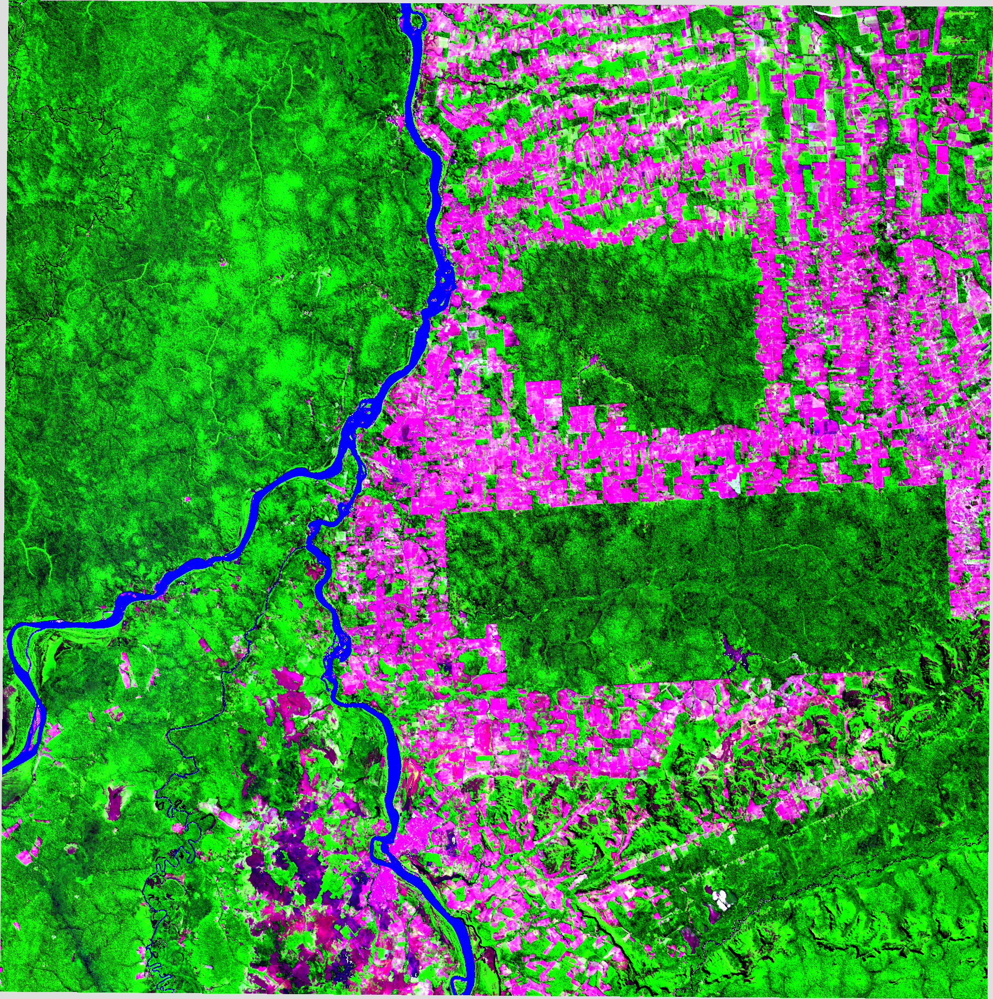

In [38]:
# view the images
sits_view(s2_cube_regular, green = "B08", red = "B11", blue = "B04", dates = "2018-07-13")

In [10]:
# show the timeline
sits_timeline(s2_cube_regular)

[1] "2018-07-03" "2018-07-13" "2018-07-19" "2018-07-29" "2018-08-04"
 [6] "2018-08-14" "2018-08-20" "2018-08-30" "2018-09-05" "2018-09-15"
[11] "2018-09-21" "2018-10-01" "2018-10-17" "2018-11-02" "2018-11-18"
[16] "2018-12-04" "2018-12-20" "2019-01-05" "2019-01-21" "2019-02-06"
[21] "2019-02-22" "2019-03-10" "2019-03-26" "2019-04-11" "2019-04-27"
[26] "2019-05-13" "2019-05-29" "2019-06-14" "2019-06-30" "2019-07-16"

In [11]:
# print the files associated to the regular cube 
print(s2_cube_regular$file_info[[1]])

# A tibble: 138 × 12
   fid   band  date         xmin    ymin   xmax    ymax  xres  yres nrows ncols
   <chr> <chr> <date>      <dbl>   <dbl>  <dbl>   <dbl> <dbl> <dbl> <dbl> <dbl>
 1 1     B03   2018-07-03 199980 8790220 309780 8900020    60    60  1830  1830
 2 1     B08   2018-07-03 199980 8790220 309780 8900020    60    60  1830  1830
 3 1     B11   2018-07-03 199980 8790220 309780 8900020    60    60  1830  1830
 4 2     B03   2018-07-13 199980 8790220 309780 8900020    60    60  1830  1830
 5 2     B04   2018-07-13 199980 8790220 309780 8900020    60    60  1830  1830
 6 2     B08   2018-07-13 199980 8790220 309780 8900020    60    60  1830  1830
 7 2     B11   2018-07-13 199980 8790220 309780 8900020    60    60  1830  1830
 8 2     B8A   2018-07-13 199980 8790220 309780 8900020    60    60  1830  1830
 9 3     B03   2018-07-19 199980 8790220 309780 8900020    60    60  1830  1830
10 3     B08   2018-07-19 199980 8790220 309780 8900020    60    60  1830  1830
# … with 128 more r

# Obtain a set of training samples for the area
<hr style="border:1px solid #0077b9;">

In [14]:
# read a CSV file 
print(read.csv(file = system.file("extdata/csv/samples_amazonia_sentinel2.csv",
                           package = "sitsdata"))[1:20,])

   id longitude   latitude start_date   end_date         label
1   1 -64.69448  -9.986312 2018-07-12 2019-07-28 Deforestation
2   2 -64.62979  -9.996668 2018-07-12 2019-07-28 Deforestation
3   3 -64.52163  -9.979772 2018-07-12 2019-07-28 Deforestation
4   4 -64.52049 -10.003682 2018-07-12 2019-07-28 Deforestation
5   5 -64.70766 -10.061506 2018-07-12 2019-07-28 Deforestation
6   6 -64.48304 -10.058156 2018-07-12 2019-07-28 Deforestation
7   7 -64.71222 -10.077481 2018-07-12 2019-07-28 Deforestation
8   8 -64.69219 -10.081132 2018-07-12 2019-07-28 Deforestation
9   9 -64.69171 -10.088997 2018-07-12 2019-07-28 Deforestation
10 10 -64.45755 -10.106381 2018-07-12 2019-07-28 Deforestation
11 11 -64.45248 -10.107471 2018-07-12 2019-07-28 Deforestation
12 12 -64.72531 -10.130816 2018-07-12 2019-07-28 Deforestation
13 13 -64.72832 -10.135567 2018-07-12 2019-07-28 Deforestation
14 14 -64.53665 -10.132420 2018-07-12 2019-07-28 Deforestation
15 15 -64.46717 -10.155378 2018-07-12 2019-07-28 Defore

In [39]:
# recover a set of time series based on a CSV file
samples_s2_20LKP <- sits_get_data(
        cube = s2_cube_regular,
        samples = system.file("extdata/csv/samples_amazonia_sentinel2.csv", package = "sitsdata"),
        multicores = 4
)

Some points could not be retrieved



# Train the samples using a machine learning model 
<hr style="border:1px solid #0077b9;">

The `sits` package provides support for the classification of time series, preserving the full temporal resolution of the input data. It supports two kinds of machine learning methods. The first group of methods does not explicitly consider spatial or temporal dimensions; these models treat time series as a vector in a high-dimensional feature space. From this class of models, `sits` includes random forests, support  vector machines,  extreme gradient boosting, and multi-layer perceptrons.

The second group of models comprises deep learning methods designed to work with image time series. Temporal relations between observed values in a time series are taken into account. The package supports two 1D-CNN algorithms: TempCNN and ResNet. Models based on 1D-CNN treat each band of an image time separately. The order of the samples in the time series is relevant for the classifier. Each layer of the network applies a convolution filter to the output of the previous layer. This cascade of convolutions captures time series features in different time scales. 

| Algoritm                                 | Function.           | Package |
|------------------------------------------|---------------------|---------|
| Support vector machine (SVM)             | `sits_svm()`          | e1071   |
| Random forests (RF)                      | `sits_rfor()`         | ranger  |
| Extreme gradient boosting                | `sits_xgboost()`      | xgboost |
| Multi-layer perceptrons (MLP)            | `sits_mlp()`          | torch   |
| 1D convolutional neural networks         | `sits_tempcnn()`      | torch   |
| Deep Residual Networks                   | `sits_resnet()`       | torch   |
| Temporal attention encoders              | `sits_tae()`          | torch   |
| Lightweight temporal attention encoders  | `sits_lighttae()`     | torch   |

In [40]:
# show the samples
print(samples_s2_20LKP)

# A tibble: 475 × 7
   longitude latitude start_date end_date   label        cube           time_s…¹
       <dbl>    <dbl> <date>     <date>     <chr>        <chr>          <list>  
 1     -65.3    -10.9 2018-07-13 2019-07-16 Pasture      SENTINEL-S2-L… <tibble>
 2     -65.3    -10.8 2018-07-13 2019-07-16 Pasture      SENTINEL-S2-L… <tibble>
 3     -65.3    -10.7 2018-07-13 2019-07-16 NatNonForest SENTINEL-S2-L… <tibble>
 4     -65.3    -10.8 2018-07-13 2019-07-16 Forest       SENTINEL-S2-L… <tibble>
 5     -65.3    -10.9 2018-07-13 2019-07-16 NatNonForest SENTINEL-S2-L… <tibble>
 6     -65.3    -10.7 2018-07-13 2019-07-16 Pasture      SENTINEL-S2-L… <tibble>
 7     -65.3    -10.6 2018-07-13 2019-07-16 Pasture      SENTINEL-S2-L… <tibble>
 8     -65.3    -10.8 2018-07-13 2019-07-16 Forest       SENTINEL-S2-L… <tibble>
 9     -65.3    -10.6 2018-07-13 2019-07-16 Forest       SENTINEL-S2-L… <tibble>
10     -65.3    -10.9 2018-07-13 2019-07-16 NatNonForest SENTINEL-S2-L… <tibble>
# … with

In [41]:
# train a random forest model
rfor_model <- sits_train(samples_s2_20LKP, ml_method = sits_rfor())

# Raster classification
<hr style="border:1px solid #0077b9;">

The implemented a new fault tolerant multi-tasking procedure for big EO data classification. Image classification in \sits is done by a cluster of independent workers linked to one or more virtual machines. To avoid communication overhead, all large payloads are read and stored independently; direct interaction between the main process and the workers is kept at a minimum. 

1. Based on the size of the cube, thenumber of cores, and the available memory, divide the cube into chunks.
2. The cube is divided into chunks along its spatial dimensions. Each chunk contains all temporal intervals.
3. Assign chunks to the worker cores. Each core processes a block and produces an output image that is a subset of the result.
4. After all the subimages are produced, join them to obtain the result.
5. If a worker fails to process a block, provide failure recovery and ensure the worker completes the job.

This approach has many advantages. It works in any virtual machine that supports R and has no dependencies on proprietary software. Processing is done in a concurrent and independent way, with no communication between workers. Failure of one worker does not cause failure of the big data processing. Thesoftware is prepared to resume classification processing from the last processed chunk, preventing against failures such as memory exhaustion, power supply interruption, or~network breakdown. All work is done smoothly and transparently. 

<img src="https://raw.githubusercontent.com/e-sensing/sitsbook/master/images/sits_parallel.png" width="800">

In [42]:
# classify the regular data cube using a random forest model
# first step: create the probabilities map
s2_20LKP_probs <- sits_classify(
    data = s2_cube_regular,
    ml_model = rfor_model,
    memsize = 12,
    multicores = 4,
    output_dir = ".",
    progress = TRUE
)

  |======================================================================| 100%


downsample set to 6



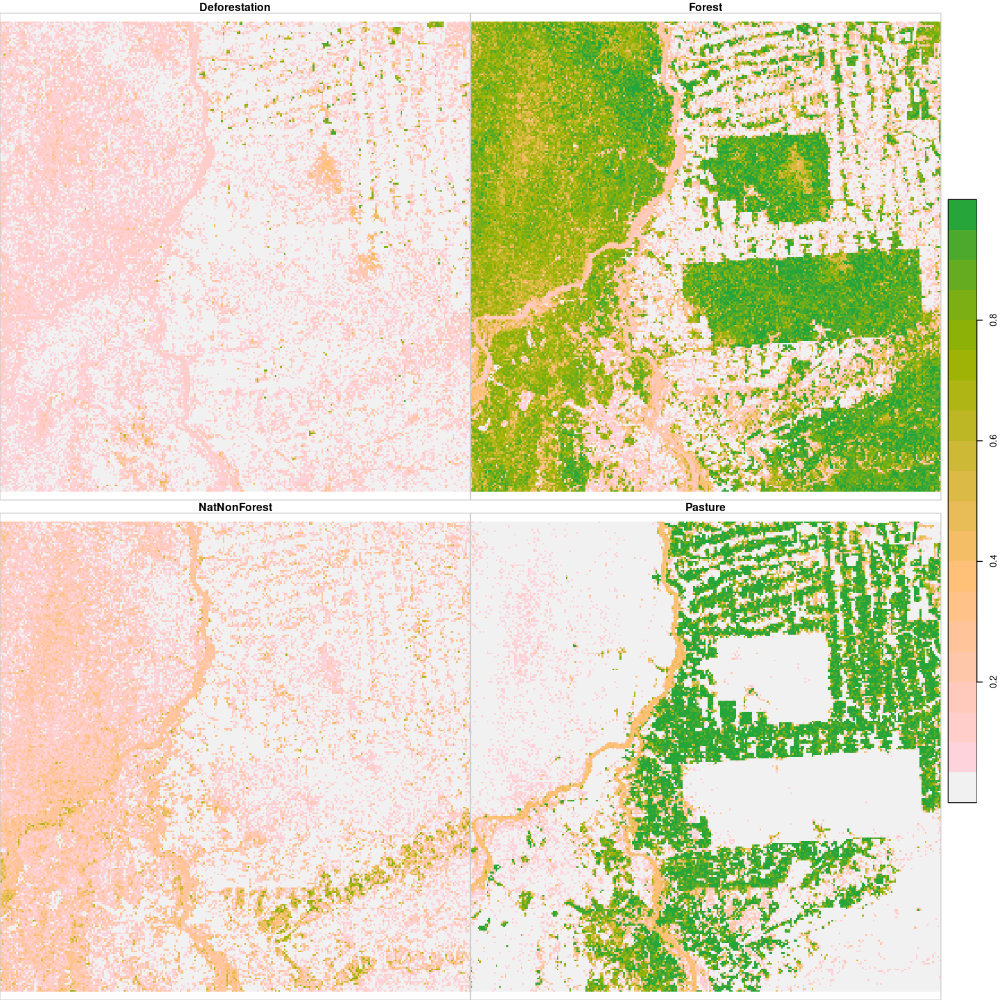

In [43]:
# plot the probabilities maps
# improve plot area
options(repr.plot.width = 12, repr.plot.height = 12)
plot(s2_20LKP_probs)

# Post-processing with bayesian smoothing
<hr style="border:1px solid #0077b9;">

When working with big EO data sets, there is a considerable degree of data variability in each class. As a result, some pixels will be misclassified. These errors are more likely to occur in transition areas between classes or when dealing with mixed pixels. To offset these problems, `sits` includes a post-processing smoothing method based on Bayesian probability that uses information from a pixel's neighbourhood to reduce uncertainty about its label.

In [44]:
# post processing with smoothing
bayes_cube <- sits_smooth(
    s2_20LKP_probs, 
    output_dir = ".",
    multicores = 4
)

downsample set to 6



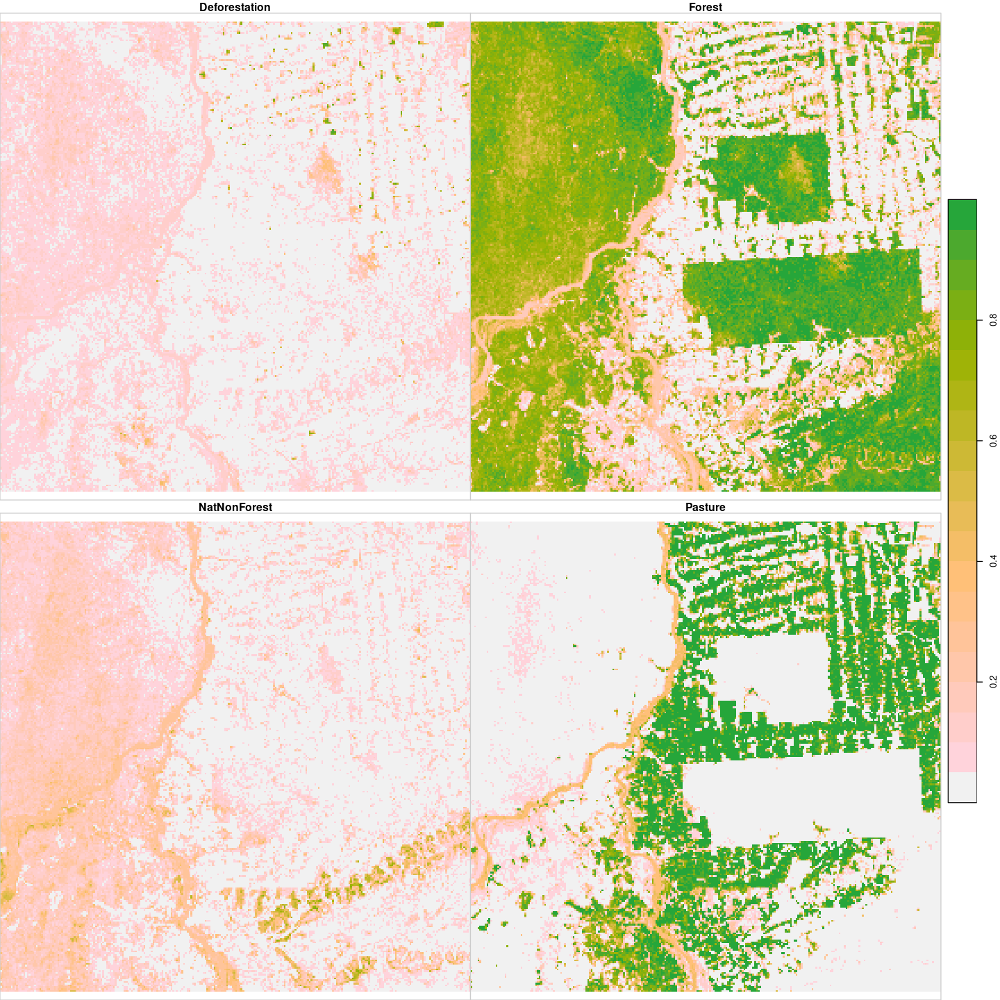

In [45]:
# plot the smoothed probabilities maps
# improve plot area
options(repr.plot.width = 12, repr.plot.height = 12)
plot(bayes_cube)

# Producing a classified map 
<hr style="border:1px solid #0077b9;">

After the smoothed probabilities maps are produced, users can generate the final labelled map. Each pixel is assigned to the class of highest probability.

In [46]:
# label the smooth probability map
map <- sits_label_classification(
    bayes_cube, 
    output_dir = ".",
    multicores = 4
)

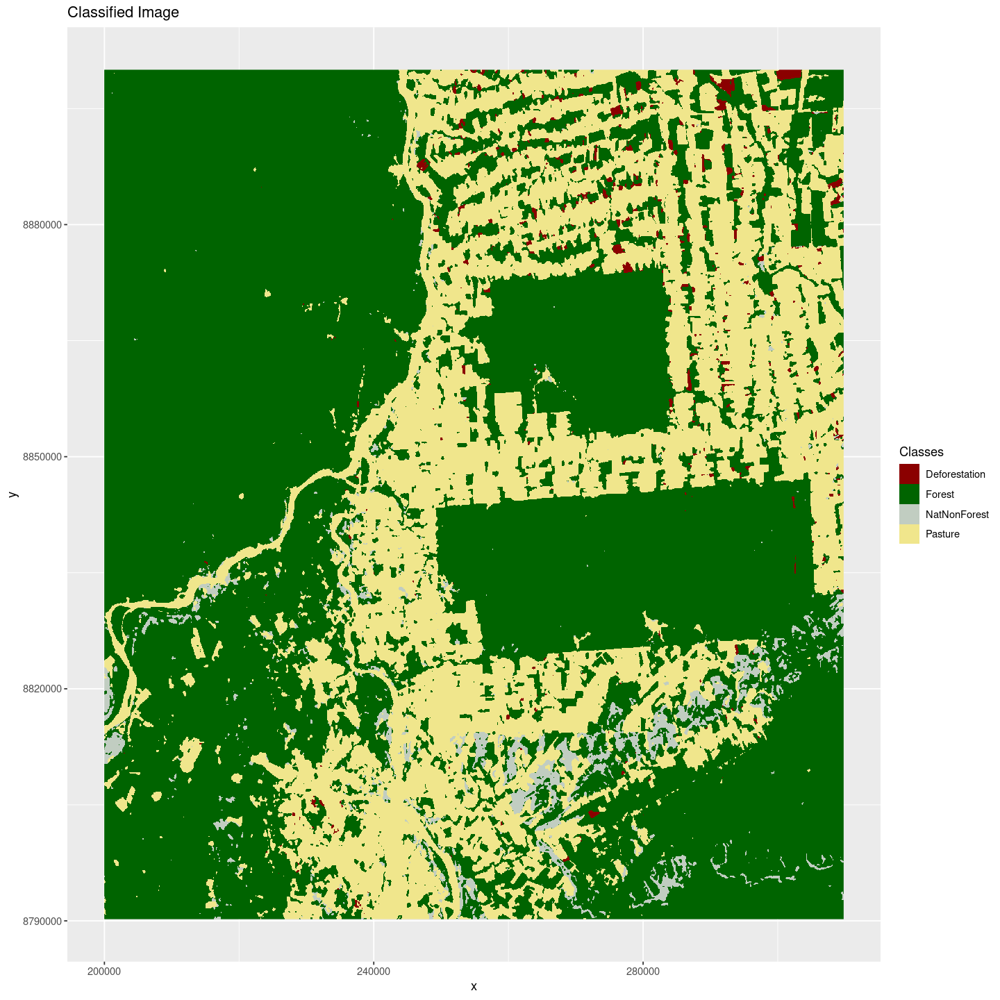

In [47]:
# plot the output labelled map
options(repr.plot.width = 12, repr.plot.height = 12)
plot(map, legend = c(Deforestation = "darkred", 
                     Forest = "darkgreen",
                     NatNonForest = "honeydew3", 
                     Pasture = "khaki"))